# Trigger Word Detection

In [1]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import glob
import IPython

from td_utils import *

from keras.callbacks import ModelCheckpoint # to save the weights during the training
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking # used to handle-length sequences by masking out padding 
from keras.layers import Conv1D, LSTM, TimeDistributed # used to apply a layer to every time step of a sequence
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape # used to reshape the input data
from keras.optimizers import Adam 

import tensorflow
from keras.models import model_from_json

/home/jerlshin/env_ai/lib/python3.10/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)
2023-09-08 23:27:34.828044: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-09-08 23:27:34.844928: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-08 23:27:34.976565: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-08 23:27:34.977552: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical op

## Data set

In [2]:
# we have to trigger when we hear "activate"
# when it hears the "activate" sound, it will make a 'chimming' sound

IPython.display.Audio("./raw_data/activates/1.wav")

In [3]:
IPython.display.Audio("./raw_data/negatives/4.wav")

In [4]:
IPython.display.Audio("./raw_data/backgrounds/1.wav")

We will use these types of recordings (positives/negatives/backgrounds) to create a labeled dataset

In [5]:
# Audio Recordings to Spectrograms
# To detect the trigger words, we use spectrogram of the audio

####### Signal Processing
# A spectrogram is computed by sliding a window over the raw audio signal and calculating the most active frequencies in each windoes using a Fourier transform

IPython.display.Audio("audio_examples/example_train.wav")

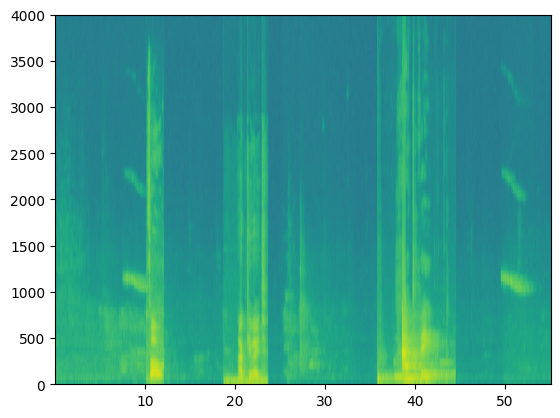

In [6]:
x = graph_spectrogram("audio_examples/example_train.wav")

In [7]:
# colors in the spectrogram shows the degree to which different frequencies are present in the audio at different points in time

# Green - certain freq is more active (louder)
# Blue - less active freq

# The number of timesteps of the spectrogram will be 5511

_, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


In [8]:
Tx = 5511 # no of time steps input to the model from the spectrogram
n_freq = 101 # no of freq input to the model at each time step of the spectrogram

- Raw audio divides 10 sec into 441,000 units
- A spectrogram divides 10 sec into 5,511 units  Tx = 5511
- We use pydub to synthesize audio, it divides 10 sec into 10,0000 units
- The output of our model will divide 10 sec into 1,375 units   Ty = 1375

For each 1375 time steps, the model predicts whether someone recently finished saying the trigger word

In [9]:
Ty = 1375

## Generating Training sample

In [10]:
# Picking a random 10 sec bg audio clip
# randomly insert 0-4 audio clips of "activate" into this 10 sec clip
# randomly insert 0-2 audio clips of negative words into this 10 sec clip

# PyDub converts raw audio files into lists of PyDub data structures
        # - pydub uses 1ms as the discretization interval (so, 1/1000 seconds)
        # that's why we have 10 sec clip as 10,000 steps

# Load audio segments using pydub
activates, negatives, backgrounds = load_raw_audio('./raw_data/')


print("background len is be 10,000, since it is a 10 sec clip \n" + str(len(backgrounds[0])),"\n")
print("activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second \n" + str(len(activates[0])),"\n")
print("activate[1] len: different `activate` clips can have different lengths\n" + str(len(activates[1])),"\n")


background len is be 10,000, since it is a 10 sec clip 
10000 

activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second 
731 

activate[1] len: different `activate` clips can have different lengths
655 



### Overlaying audio clips on top of the background audio

- While we insert multiple clips of pos/neg words into the bg, we don't want words to overlap another word clip, 

So, we keep track of the times of prev inserted audio clips


In [11]:
# yt_hat = 1 when the clip has finished saying "activate"
# so, for bg clip, we initialize all the yt_hat = 0, since we have no words,
## So, when we overlay the clip "activate" we will update 50 steps of the output to have target label 1 to make the model more balance

# We'll train a Gated Recurrent Unit to detect when someone has finished saying trigger word


### Helper Functions:
```
get_random_time_segment(segment_ms)
is_overlapping(segment_time, existing_segments)
insert_audio_clip(background, audio_clip, existing_times)
insert_ones(y, segment_end_ms)
```

In [12]:
def get_random_time_segment(segment_ms): # duration of the audio clip
    segment_start = np.random.randint(low=0, high=10000 - segment_ms) # sub the segment_ms so that it wont exceed the total clip 10,000
    segment_end = segment_start + segment_ms - 1 # from start to end, minus 1 (we took the start that includes, so, we minus 1)
    
    return (segment_start, segment_end)

In [13]:
def is_overlapping(segment_time, previous_segments):
    # segment_time -- a tuple of (segment_start, segment_end) for the new segment
    # previous_segments -- a #list# of tuples of (segment_start, segment_end) for the existing segments
    
    segment_start, segment_end = segment_time
    overlap = False
    
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start:
            overlap = True
            break
    return overlap

In [14]:
def insert_audio_clip(background, audio_clip, previous_segments):
    # backgroud - 10 sec bg audio recording
    # audio_clip - that to be inserted
    # previous_segment - times where audio segments have already been placed
    
    segment_ms = len(audio_clip) # duration of audio clip
    segment_time = get_random_time_segment(segment_ms)
    
    retry = 5 # no of times we have to re try if it overlaps
    while is_overlapping(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment_ms)
        retry = retry - 1
    
    if not is_overlapping(segment_time, previous_segments):
        previous_segments.append(segment_time)
        new_background = background.overlay(audio_clip, position = segment_time[0]) # pydub's overlay method
    else:
        new_background = background # if overlap, set the new_background to the same background
        segment_time = (10000, 10000) # to indicate that it couldn't finda a non-overlapping segment
    
    return new_background, segment_time
    
    # return new background

In [15]:
IPython.display.Audio("audio_examples/insert_reference.wav")

In [16]:
def insert_ones(y, segment_end_ms): # end time of the segment, in ms
    # y - numpy array, (1, Ty), labels of the training example
    _, Ty = y.shape
    
    # duration of the background (spectrogram)
    segment_end_y = int(segment_end_ms * Ty / 10000.0) # calculating the position int he target array
    
    if segment_end_y < Ty: # within the bounds
        for i in range(segment_end_y + 1, segment_end_ms + 51):
            if i < Ty: # we dont go beyond the bound
                y[0, i] = 1
    
    return y

In [17]:
def create_training_example(background, activates, negatives, Ty):
    background = background - 20
    y = np.zeros((1, Ty))

    previous_segments = []
    
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    for one_random_activate in random_activates:
        background, segment_time = insert_audio_clip(background, one_random_activate, previous_segments)
        segment_start, segment_end = segment_time
        y = insert_ones(y, segment_end)

    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    for random_negative in random_negatives: # @KEEP
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
         
    background = match_target_amplitude(background, -20.0)

    file_handle = background.export("train" + ".wav", format="wav")
    
    x = graph_spectrogram("train.wav")
    
    return x, y

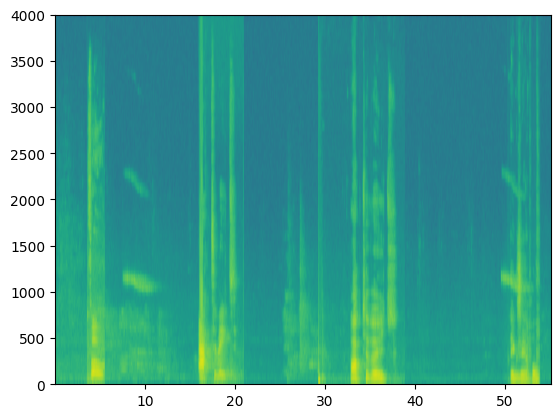

In [18]:
np.random.seed(18)
x, y = create_training_example(backgrounds[0], activates, negatives, Ty)

0
10
20
30


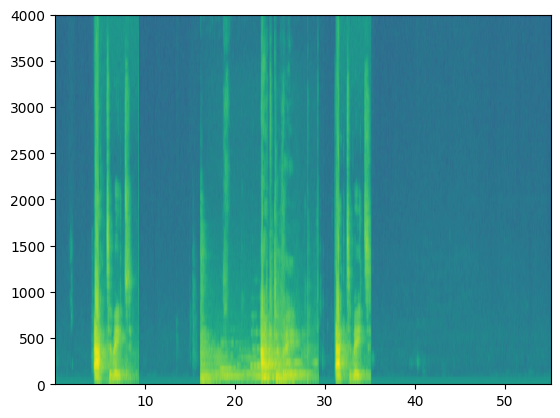

In [19]:
np.random.seed(4543)
nsamples = 32
X = []
Y = []
for i in range(0, nsamples):
    if i%10 == 0:
        print(i)
    x, y = create_training_example(backgrounds[i % 2], activates, negatives, Ty)
    X.append(x.swapaxes(0,1))
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)

In [20]:
np.save(f'./XY_train/X.npy', X)
np.save(f'./XY_train/Y.npy', Y)

X = np.load("./XY_train/X.npy")
Y = np.load("./XY_train/Y.npy")

In [21]:
X_dev = np.load("./XY_dev/X_dev.npy")
Y_dev = np.load("./XY_dev/Y_dev.npy")

* A conv layer
* Two GRU layers
* A dense layer

In [22]:
## 1D conv layer - inputs 5511 step spectrogram, each step is a vector of 101 units. It outputs 1375 step output Ty. Extracts low-level features

def modelf(input_shape):
    
    X_input = Input(shape = input_shape)
    
    # Add a Conv1D with 196 units, kernel size of 15 and stride of 4
    X = Conv1D(196, 15, strides=4)(X_input)
    # Batch normalization
    X = BatchNormalization()(X)
    # ReLu activation
    X = Activation('relu')(X)
    # dropout 
    X = Dropout(0.8)(X)                                  

    # GRU 
    X = GRU(units = 128, return_sequences=True)(X)
    # dropout 
    X = Dropout(0.8)(X)
    # Batch normalization.
    X = BatchNormalization()(X)                          
    
    # GRU 
    X = GRU(units = 128, return_sequences=True)(X)
    # dropout 
    X = Dropout(0.8)(X)       
    # Batch normalization
    X = BatchNormalization()(X)
    # dropout (use 0.8)
    X = Dropout(0.8)(X)
    
    # TimeDistributed  with sigmoid activation 
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X)

    model = Model(inputs = X_input, outputs = X)
    
    return model

![Alt text](image.png)

In [23]:
model = modelf(input_shape=(Tx, n_freq))
print(n_freq)

2023-09-08 23:27:46.691400: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-08 23:27:46.692201: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


101


In [24]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 5511, 101)]       0         
                                                                 
 conv1d (Conv1D)             (None, 1375, 196)         297136    
                                                                 
 batch_normalization (Batch  (None, 1375, 196)         784       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 1375, 196)         0         
                                                                 
 dropout (Dropout)           (None, 1375, 196)         0         
                                                                 
 gru (GRU)                   (None, 1375, 128)         125184    
                                                             

In [25]:
json_file = open('./models/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()

model = model_from_json(loaded_model_json)

model.load_weights('./models/model.h5')

In [26]:
# we block the training for BatchNormalization layers
# we are training all the other layers

model.layers[2].trainable = False
model.layers[7].trainable = False
model.layers[10].trainable = False

In [27]:
opt = Adam(learning_rate=1e-6, beta_1=0.9, beta_2=0.999)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [28]:
model.fit(X, Y, batch_size = 16, epochs=10)

Epoch 1/10


2/2 [==============================] - 6s 1s/step - loss: 1.8932 - accuracy: 0.4986
Epoch 2/10
2/2 [==============================] - 3s 1s/step - loss: 1.8702 - accuracy: 0.5010
Epoch 3/10
2/2 [==============================] - 3s 1s/step - loss: 1.8819 - accuracy: 0.4984
Epoch 4/10
2/2 [==============================] - 3s 1s/step - loss: 1.8804 - accuracy: 0.5025
Epoch 5/10
2/2 [==============================] - 2s 1s/step - loss: 1.8558 - accuracy: 0.5007
Epoch 6/10
2/2 [==============================] - 2s 1s/step - loss: 1.8825 - accuracy: 0.4973
Epoch 7/10
2/2 [==============================] - 2s 1s/step - loss: 1.8630 - accuracy: 0.5001
Epoch 8/10
2/2 [==============================] - 2s 1s/step - loss: 1.8606 - accuracy: 0.5004
Epoch 9/10
2/2 [==============================] - 2s 1s/step - loss: 1.8690 - accuracy: 0.5005
Epoch 10/10
2/2 [==============================] - 2s 1s/step - loss: 1.8312 - accuracy: 0.5087


In [29]:
loss, acc, = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 1s 1s/step - loss: 0.1883 - accuracy: 0.9228
Dev set accuracy =  0.9227636456489563


In [30]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    
    # Correct the amplitude of the input file before prediction 
    audio_clip = AudioSegment.from_wav(filename)
    audio_clip = match_target_amplitude(audio_clip, -20.0)
    file_handle = audio_clip.export("tmp.wav", format="wav")
    filename = "tmp.wav"

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

In [31]:
chime_file = "audio_examples/alert.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Initializing the number of consecutive output steps to 0
    consecutive_timesteps = 0
    # go output steps in the y
    for i in range(Ty):
        # Incrementing consecutive output steps
        consecutive_timesteps += 1
        # If prediction is higher than the threshold and more than 20 consecutive output steps have passed
        if consecutive_timesteps > 20:
            # Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds) * 1000)
            # Reset consecutive output steps to 0
            consecutive_timesteps = 0
        # if amplitude is smaller than the threshold reset the consecutive_timesteps counter
        if predictions[0, i, 0] < threshold:
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

In [ ]:
IPython.display.Audio("./raw_data/dev/2.wav")

ValueError: in user code:

    File "/home/jerlshin/env_ai/lib/python3.10/site-packages/keras/src/engine/training.py", line 2341, in predict_function  *
        return step_function(self, iterator)
    File "/home/jerlshin/env_ai/lib/python3.10/site-packages/keras/src/engine/training.py", line 2327, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/jerlshin/env_ai/lib/python3.10/site-packages/keras/src/engine/training.py", line 2315, in run_step  **
        outputs = model.predict_step(data)
    File "/home/jerlshin/env_ai/lib/python3.10/site-packages/keras/src/engine/training.py", line 2283, in predict_step
        return self(x, training=False)
    File "/home/jerlshin/env_ai/lib/python3.10/site-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/home/jerlshin/env_ai/lib/python3.10/site-packages/keras/src/engine/input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "model" is incompatible with the layer: expected shape=(None, 5511, 101), found shape=(None, 4174, 101)


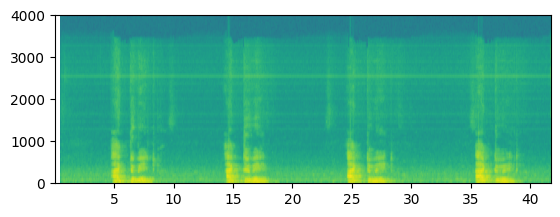

In [34]:
filename = "./raw_data/dev/my_voice.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

1/1 [==============================] - 1s 650ms/step


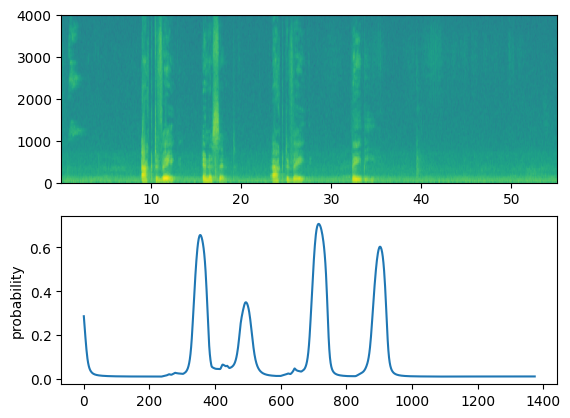

In [35]:
filename  = "./raw_data/dev/2.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

In [36]:
# Preprocess the audio to the correct format
def preprocess_audio(filename):
    # Trim or pad audio segment to 10000ms
    padding = AudioSegment.silent(duration=10000)
    segment = AudioSegment.from_wav(filename)[:10000]
    segment = padding.overlay(segment)
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')

In [44]:
your_filename = "audio_examples/my_audio.wav"

In [45]:
preprocess_audio(your_filename)
IPython.display.Audio(your_filename) # listen to the audio you uploaded 

1/1 [==============================] - 0s 170ms/step


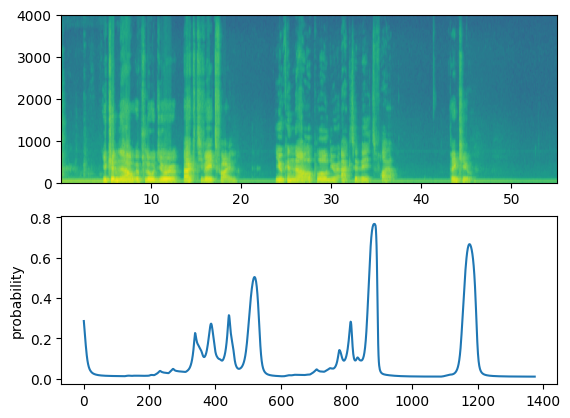

In [39]:
chime_threshold = 0.5
prediction = detect_triggerword(your_filename)
chime_on_activate(your_filename, prediction, chime_threshold)
IPython.display.Audio("./chime_output.wav")

In [48]:
from keras.models import model_from_json

json_file = open('./models/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights('./models/model.h5')

opt = Adam(learning_rate=1e-6, beta_1=0.9, beta_2=0.999)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

loss, acc, = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 1s 1s/step - loss: 0.1884 - accuracy: 0.9239
Dev set accuracy =  0.9238981604576111
